# Topic Modeling


Team: Ami Chauhan,
Jacob Ditkoff,
Meghana Harisha,
Prarthna Mohanraj,
Mukta Parab

**1. What is the problem the three papers aim to solve, and why is this problem important or interesting? (5 points)**

Accurately modeling collections of discrete data through topics, while 
maintaining relationships between data so tasks like classification, novelty detection and summarization can be done on the data. 

Probabilistic topic models are important because they allow us to organize and quantify huge sums of data at a scale that would be impossible for humans to do alone. It can also be used to identify the topics of a set of collections by detecting the patterns and recurring words.


**2. 1) Summarize the three methods, including high-level ideas as well as technical details: the relevant details that are important to focus on (e.g., if there’s a model, define it; if there is a theorem, state it and explain why it’s important, etc) 2) What are the major differences of the three methods? (15 points)**

**Paper 2**
*   Autoencoded Variational Inference (AVITM) : a black box method that is easy to apply to new models. It yields topics of equivalent quality to standard mean field inference with a decrease in training time. It matches traditional methods and accuracy with much better inference time.
*   Model: PRODLDA
*   It is a product of experts, p(wn|θ, β) ∝ k p(wn|zn = k, β) θk 
*   Defined as latent Dirichlet allocation where the word-level mixture over topics is carried out in natural parameter space. 
*   The difference between LDA and PRODLDA is that the beta is unnormalized.
*   Yields much more interpretable topics.
*   PRODLDA is an instance of the exponential-family PCA.
*   It relates to the exponential-family harmoniums but with nonGaussian priors. 

Advantages: 
*   Topic coherence : This model consistently returns better topics than LDA.
*   Computational efficiency: Training AVITM is very fast and efficient, since it requires only one forward path through a neural network.
*   Black box : AVITM  can be applied to wide range of topic models and does not require rigorous mathematical derivations to handle changes in the model.
*   AVITM is cost effective.













**3. Implement the ProdLDA [2] topic model and test it on the 20 newsgroups text dataset (report the 20 main topics you discovered from the data and visualize their word clouds) (30 points)**


In [ ]:
!pip install pyro-ppl

import os
import pyro
import pyro.distributions as dist
from pyro.infer import MCMC, NUTS
import torch

assert pyro.__version__.startswith('1.7.0')
# Enable smoke test - run the notebook cells on CI.
smoke_test = 'CI' in os.environ

In [ ]:
# def model(counts):
#     theta = pyro.sample('theta', dist.Dirichlet(torch.ones(6)))
#     total_count = int(counts.sum())
#     pyro.sample('counts', dist.Multinomial(total_count, theta), obs=counts)

# data = torch.tensor([5, 4, 2, 5, 6, 5, 3, 3, 1, 5, 5, 3, 5, 3, 5, \
#                      3, 5, 5, 3, 5, 5, 3, 1, 5, 3, 3, 6, 5, 5, 6])
# counts = torch.unique(data, return_counts=True)[1].float()

# nuts_kernel = NUTS(model)
# num_samples, warmup_steps = (1000, 200) if not smoke_test else (10, 10)
# mcmc = MCMC(nuts_kernel, num_samples=1000, warmup_steps=200)
# mcmc.run(counts)
# hmc_samples = {k: v.detach().cpu().numpy()
#                for k, v in mcmc.get_samples().items()}

Sample: 100%|██████████| 1200/1200 [00:14, 82.88it/s, step size=5.74e-01, acc. prob=0.925]


In [ ]:
# means = hmc_samples['theta'].mean(axis=0)
# stds = hmc_samples['theta'].std(axis=0)
# print('Inferred dice probabilities from the data (68% confidence intervals):')
# for i in range(6):
#     print('%d: %.2f ± %.2f' % (i + 1, means[i], stds[i]))

Inferred dice probabilities from the data (68% confidence intervals):
1: 0.09 ± 0.05
2: 0.06 ± 0.04
3: 0.28 ± 0.08
4: 0.05 ± 0.04
5: 0.42 ± 0.08
6: 0.11 ± 0.05


In [ ]:
# def model(data):
#     theta = pyro.sample('theta', dist.Dirichlet(torch.ones(6)))
#     with pyro.plate('data', len(data)):
#         pyro.sample('obs', dist.Categorical(theta), obs=data)

# nuts_kernel = NUTS(model)
# num_samples, warmup_steps = (1000, 200) if not smoke_test else (10, 10)
# mcmc = MCMC(nuts_kernel, num_samples=num_samples, warmup_steps=warmup_steps)
# mcmc.run(data - 1)  # -1: we need to work with indices [0, 5] instead of [1, 6]
# hmc_samples = {k: v.detach().cpu().numpy()
#                for k, v in mcmc.get_samples().items()}

NameError: ignored

In [ ]:
import pandas as pd
import numpy as np
from sklearn.datasets import fetch_20newsgroups
from sklearn.feature_extraction.text import CountVectorizer

In [ ]:
news = fetch_20newsgroups(subset='all')
vectorizer = CountVectorizer(max_df=0.5, min_df=20, stop_words='english')
docs = torch.from_numpy(vectorizer.fit_transform(news['data']).toarray())
#TODO - make sure docs is same dimensionality as tweets and set docs to tweets if it is! (For testing out tweets in ProdLDA model)
vocab = pd.DataFrame(columns=['word', 'index'])
vocab['word'] = vectorizer.get_feature_names()
vocab['index'] = vocab.index

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


In [ ]:
import math
import torch.nn as nn
import torch.nn.functional as F
from pyro.infer import SVI, TraceMeanField_ELBO
from tqdm import trange

In [ ]:
class Encoder(nn.Module):
    # Base class for the encoder net, used in the guide
    def __init__(self, vocab_size, num_topics, hidden, dropout):
        super().__init__()
        self.drop = nn.Dropout(dropout)  # to avoid component collapse
        self.fc1 = nn.Linear(vocab_size, hidden)
        self.fc2 = nn.Linear(hidden, hidden)
        self.fcmu = nn.Linear(hidden, num_topics)
        self.fclv = nn.Linear(hidden, num_topics)
        # NB: here we set `affine=False` to reduce the number of learning parameters
        # See https://pytorch.org/docs/stable/generated/torch.nn.BatchNorm1d.html
        # for the effect of this flag in BatchNorm1d
        self.bnmu = nn.BatchNorm1d(num_topics, affine=False)  # to avoid component collapse
        self.bnlv = nn.BatchNorm1d(num_topics, affine=False)  # to avoid component collapse

    def forward(self, inputs):
        h = F.softplus(self.fc1(inputs))
        h = F.softplus(self.fc2(h))
        h = self.drop(h)
        # μ and Σ are the outputs
        logtheta_loc = self.bnmu(self.fcmu(h))
        logtheta_logvar = self.bnlv(self.fclv(h))
        logtheta_scale = (0.5 * logtheta_logvar).exp()  # Enforces positivity
        return logtheta_loc, logtheta_scale


class Decoder(nn.Module):
    # Base class for the decoder net, used in the model
    def __init__(self, vocab_size, num_topics, dropout):
        super().__init__()
        self.beta = nn.Linear(num_topics, vocab_size, bias=False)
        self.bn = nn.BatchNorm1d(vocab_size, affine=False)
        self.drop = nn.Dropout(dropout)

    def forward(self, inputs):
        inputs = self.drop(inputs)
        # the output is σ(βθ)
        return F.softmax(self.bn(self.beta(inputs)), dim=1)


class ProdLDA(nn.Module):
    def __init__(self, vocab_size, num_topics, hidden, dropout):
        super().__init__()
        self.vocab_size = vocab_size
        self.num_topics = num_topics
        self.encoder = Encoder(vocab_size, num_topics, hidden, dropout)
        self.decoder = Decoder(vocab_size, num_topics, dropout)

    def model(self, docs):
        pyro.module("decoder", self.decoder)
        with pyro.plate("documents", docs.shape[0]):
            # Dirichlet prior 𝑝(𝜃|𝛼) is replaced by a logistic-normal distribution
            logtheta_loc = docs.new_zeros((docs.shape[0], self.num_topics))
            logtheta_scale = docs.new_ones((docs.shape[0], self.num_topics))
            logtheta = pyro.sample(
                "logtheta", dist.Normal(logtheta_loc, logtheta_scale).to_event(1))
            theta = F.softmax(logtheta, -1)

            # conditional distribution of 𝑤𝑛 is defined as
            # 𝑤𝑛|𝛽,𝜃 ~ Categorical(𝜎(𝛽𝜃))
            count_param = self.decoder(theta)
            # Currently, PyTorch Multinomial requires `total_count` to be homogeneous.
            # Because the numbers of words across documents can vary,
            # we will use the maximum count accross documents here.
            # This does not affect the result because Multinomial.log_prob does
            # not require `total_count` to evaluate the log probability.
            total_count = int(docs.sum(-1).max())
            pyro.sample(
                'obs',
                dist.Multinomial(total_count, count_param),
                obs=docs
            )

    def guide(self, docs):
        pyro.module("encoder", self.encoder)
        with pyro.plate("documents", docs.shape[0]):
            # Dirichlet prior 𝑝(𝜃|𝛼) is replaced by a logistic-normal distribution,
            # where μ and Σ are the encoder network outputs
            logtheta_loc, logtheta_scale = self.encoder(docs)
            logtheta = pyro.sample(
                "logtheta", dist.Normal(logtheta_loc, logtheta_scale).to_event(1))

    def beta(self):
        # beta matrix elements are the weights of the FC layer on the decoder
        return self.decoder.beta.weight.cpu().detach().T

In [ ]:
# setting global variables
seed = 0
torch.manual_seed(seed)
pyro.set_rng_seed(seed)
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

num_topics = 20 if not smoke_test else 3
docs = docs.float().to(device)
batch_size = 32
learning_rate = 1e-3
num_epochs = 50 if not smoke_test else 1

In [ ]:
# training
pyro.clear_param_store()

prodLDA = ProdLDA(
    vocab_size=docs.shape[1],
    num_topics=num_topics,
    hidden=100 if not smoke_test else 10,
    dropout=0.2
)
prodLDA.to(device)

optimizer = pyro.optim.Adam({"lr": learning_rate})
svi = SVI(prodLDA.model, prodLDA.guide, optimizer, loss=TraceMeanField_ELBO())
num_batches = int(math.ceil(docs.shape[0] / batch_size)) if not smoke_test else 1

bar = trange(num_epochs)
for epoch in bar:
    running_loss = 0.0
    for i in range(num_batches):
        batch_docs = docs[i * batch_size:(i + 1) * batch_size, :]
        loss = svi.step(batch_docs)
        running_loss += loss / batch_docs.size(0)

    bar.set_postfix(epoch_loss='{:.2e}'.format(running_loss))

100%|██████████| 50/50 [25:31<00:00, 30.63s/it, epoch_loss=3.72e+05]


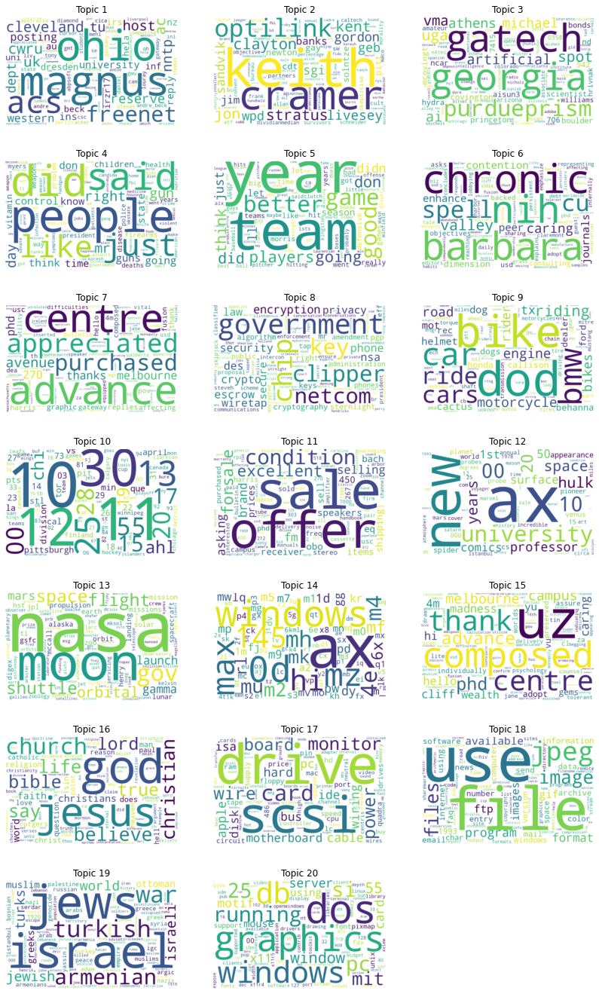

In [ ]:
def plot_word_cloud(b, ax, v, n):
    sorted_, indices = torch.sort(b, descending=True)
    df = pd.DataFrame(indices[:100].numpy(), columns=['index'])
    words = pd.merge(df, vocab[['index', 'word']],
                     how='left', on='index')['word'].values.tolist()
    sizes = (sorted_[:100] * 1000).int().numpy().tolist()
    freqs = {words[i]: sizes[i] for i in range(len(words))}
    wc = WordCloud(background_color="white", width=800, height=500)
    wc = wc.generate_from_frequencies(freqs)
    ax.set_title('Topic %d' % (n + 1))
    ax.imshow(wc, interpolation='bilinear')
    ax.axis("off")

if not smoke_test:
    import matplotlib.pyplot as plt
    from wordcloud import WordCloud

    beta = prodLDA.beta()
    fig, axs = plt.subplots(7, 3, figsize=(14, 24))
    for n in range(beta.shape[0]):
        i, j = divmod(n, 3)
        plot_word_cloud(beta[n], axs[i, j], vocab, n)
    axs[-1, -1].axis('off');

    plt.show()

**5. Implement TOP2VEC [3] and test it on the 20 newsgroups text dataset (report the 20 main topics you discovered from the data and visualize their word clouds) (30 points)**
Reference code: https://github.com/ddangelov/Top2Vec 


In [ ]:
!pip install top2vec

In [ ]:
from top2vec import Top2Vec
from sklearn.datasets import fetch_20newsgroups

newsgroups = fetch_20newsgroups(subset='all', remove=('headers', 'footers', 'quotes'))
model = Top2Vec(documents=newsgroups.data, speed="learn", workers=8)





<class 'list'>


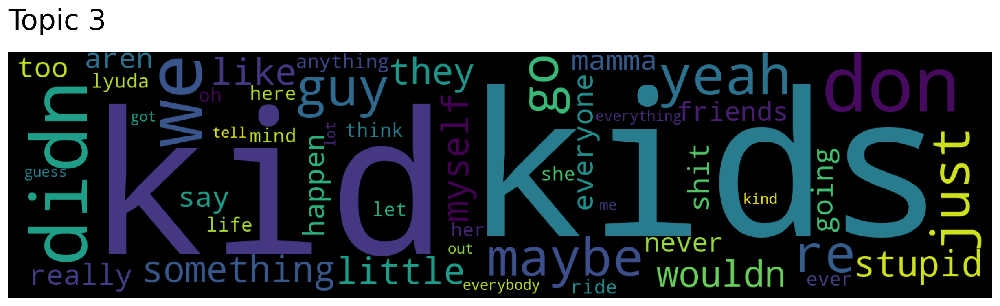

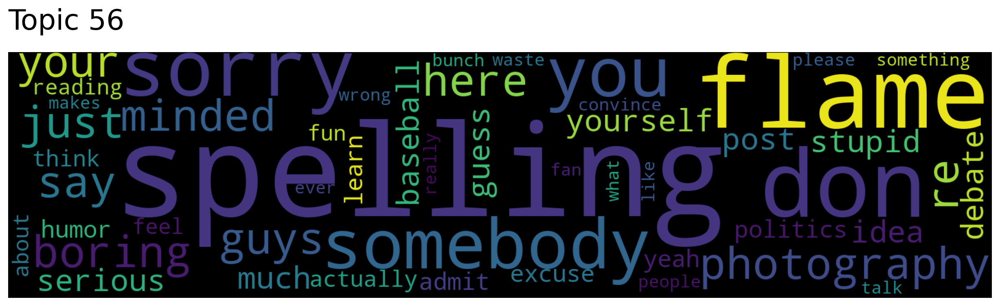

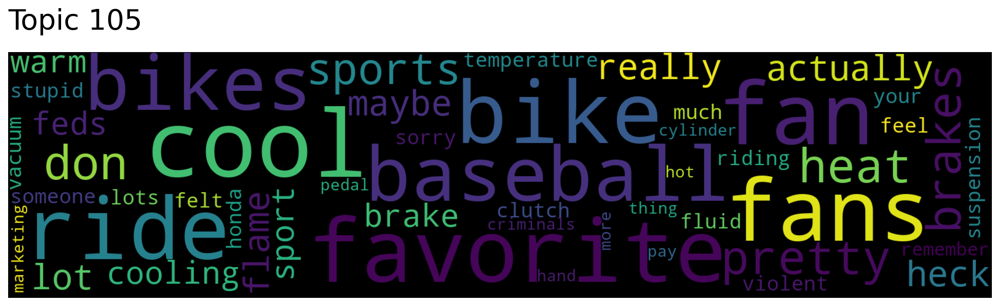

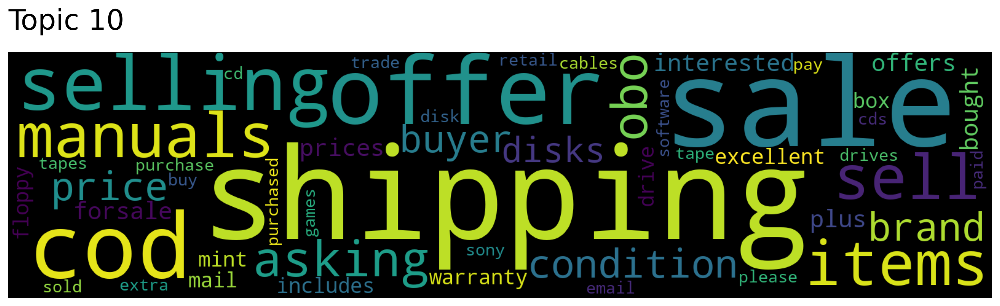

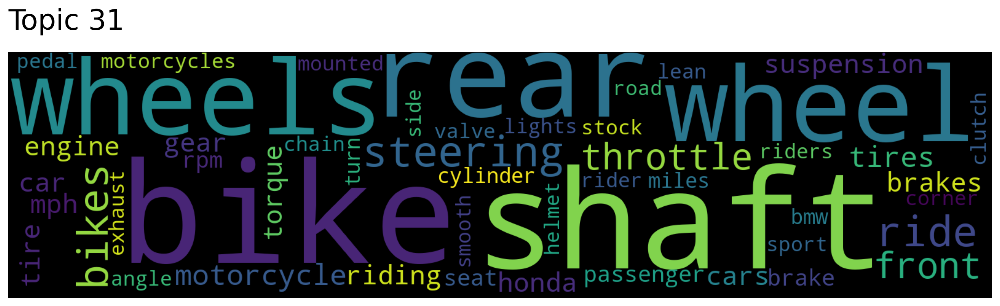

...

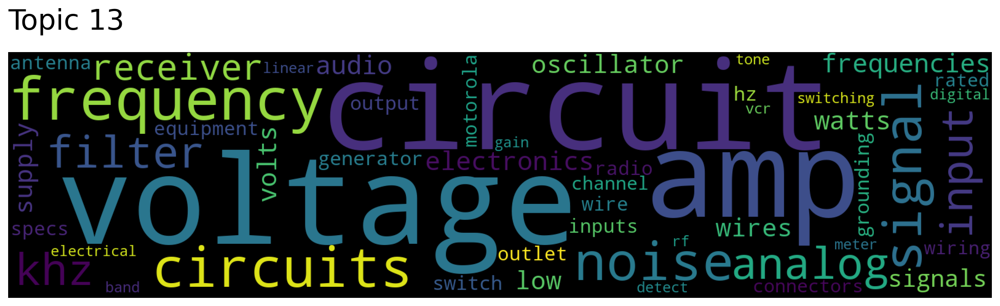

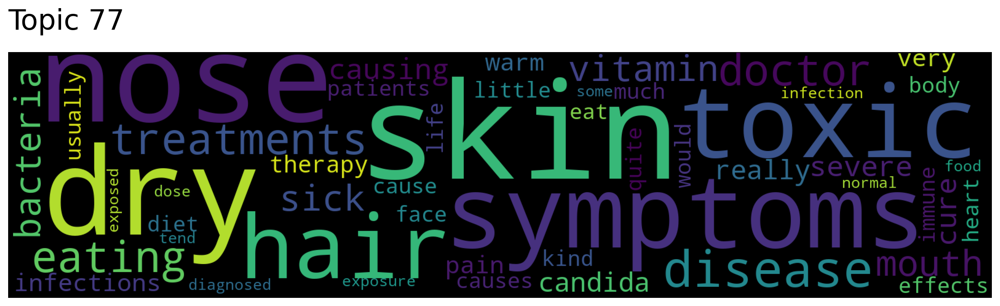

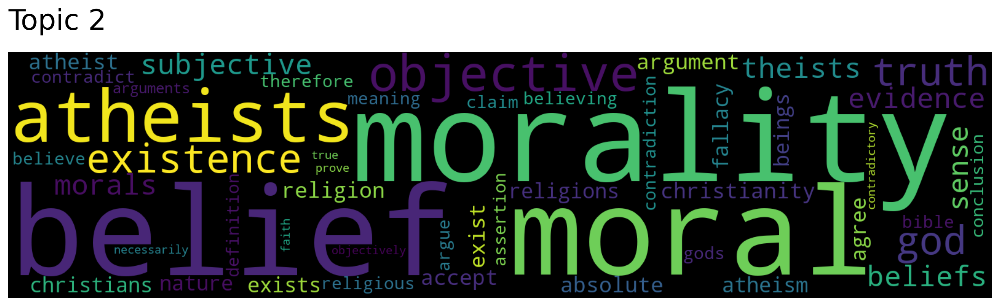

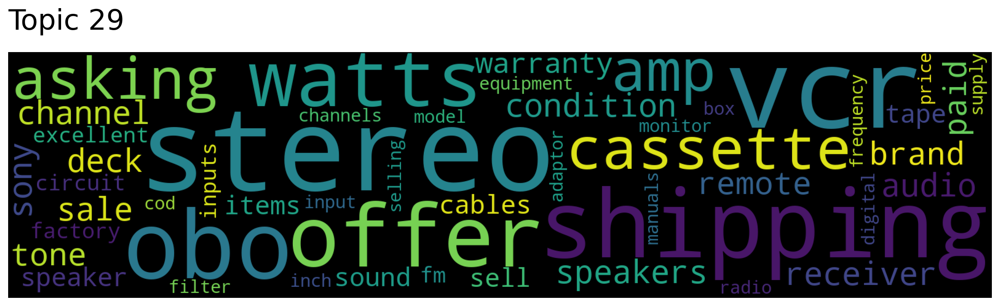

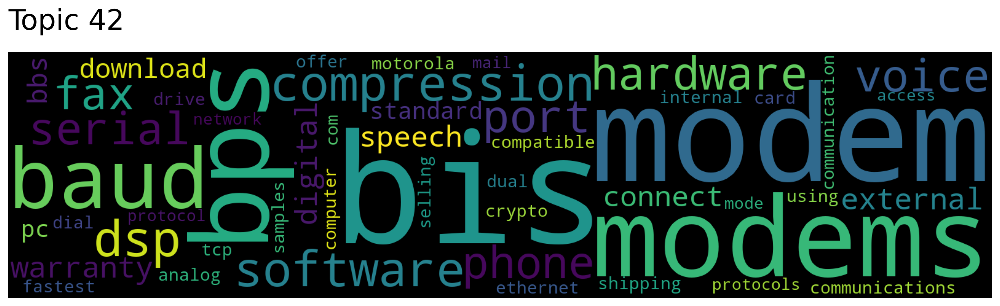

In [ ]:
topic_words, word_scores, topic_scores = model.get_topics()
topic_list = []
for doc in topic_words:
  for topic in doc:
    topic_list.append(topic)

topic_words, word_scores, topic_scores, topic_nums = model.search_topics(keywords=topic_list, num_topics=20)
for topic in topic_nums:
  model.generate_topic_wordcloud(topic)

7. Fetch real-time tweets and discover real-time topics on them with the three methods, respectively. You need to report the top 5 topics for the last 5 seconds in real-time and the top 5 topics for each hour in the most recent 24 hours. (20 points)